# Investigating vertical distribution of $Sv$ in a subsample of ABRAÇOS I data

In order to model the evolution of scattering layers, we want to visualize each time step (actually ESDU) as a 1D vector representing the profile $Sv = f(z)$.

This should help us assess the possibility to model our data as a process $X_t$ where for all $t \in 1,..., T$:

* $X_t \in \mathbb{R}^{Z \times C}$.
* $X_t$ can be seen as the sum of $K_t$ distinct "layers" (ideally normal distributions).
* $X_{t+1}$ is a small transformation from $X_t$ and usually the $K_t$ layers.

## 1. Importing ABRAÇOS I data and select the first day

We focus on this subset of the data for faster computation, and because it was sampled in deep waters (> 800 m) so we can observe the full vertical distribution of $Sv$ in the water column.

In [1]:
# Imports
import os
from pathlib import Path
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

from src.visualization.visualize import plot_sv_rgb



In [ ]:
# Indicate file paths and assert file existence
raw_data_path = Path("../../data/raw/")
raw_acoustic_A1_path = raw_data_path / "acoustic-data/netCDF-echointegrations/Abracos_A1/high-res/"

leg1_path = raw_acoustic_A1_path / "LEG01/IRD_SOOP-BA_A_20150929T192933Z_ANTEA_FV02_ABRACOS-38-70-120-200_END-20151021T190616Z_C.nc"

assert os.path.isfile(leg1_path), "LEG1 file not found."

# Open as xarray dataset and keep only the first day
delta = np.timedelta64(25, 'h') # We keep the first 25 hours because of a sampling issue when adding 24 hours leading to only 20 hours in actual delta
ds = xr.open_dataset(leg1_path)
ds = ds.sel(time = slice(ds.time.values[0], ds.time.values[0] + delta))

print("Sample start time: ",ds.time.values[0])
print("Added delta: ", delta.astype('timedelta64[s]').item())      
print("Sample end time: ", ds.time.values[-1])

delta_actual = (ds.time.values[-1] - ds.time.values[0]).astype('timedelta64[s]').item()
print("Actual delta in hours:", delta_actual)

Sample start time:  2015-09-29T19:29:42.861096704
Added delta:  1 day, 1:00:00
Sample end time:  2015-09-30T20:29:38.053404672
Actual delta in hours: 1 day, 0:59:55


RGB Sv image saved as 'output/figures/A1_Sv_RGB_38_70_120kHz_first_day.png'


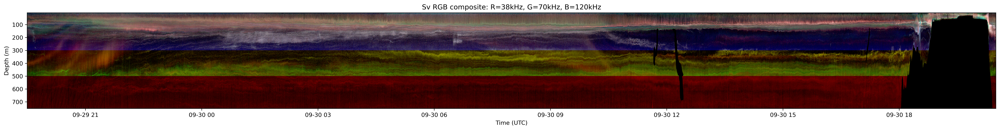

In [3]:
# Check RGB image
force_plot = True
output_path = "output/figures/A1_Sv_RGB_38_70_120kHz_first_day.png"

if (not os.path.isfile(output_path)) or force_plot:
    plot_sv_rgb(
        ds.Sv,
        outfile=output_path,
        figsize=(30, 3),
        vmin=-90,
        vmax=-50
    )
img = Image.open(output_path)
img

We can see that this sample is particularly relevant :

* It contains a full day, almost entirely offshore, meaning we can see the diel vertical migration happening. Upward migration is already ongoing at the start and downward migration starts around 10 am.

* Some layers or clean, but clearly not all of them, allowing us to visualize a large diversity of patterns.

## 2. Visualizing the vertical profiles for each channel at $t = 0$

In [4]:
# Get vertical profile of Sv for each channel at t_0
x_t = ds.Sv.isel(time = 0).to_dataframe().reset_index()
x_t.head()

,channel,depth,time,latitude,longitude,Sv
0,38.0,7.5,2015-09-29 19:29:42.861096704,-5.513748,-34.84402,-150.000000
1,38.0,8.5,2015-09-29 19:29:42.861096704,-5.513748,-34.84402,-150.000000
2,38.0,9.5,2015-09-29 19:29:42.861096704,-5.513748,-34.84402,-150.000000
3,38.0,10.5,2015-09-29 19:29:42.861096704,-5.513748,-34.84402,-92.915329
4,38.0,11.5,2015-09-29 19:29:42.861096704,-5.513748,-34.84402,-95.138344


In [5]:
# Get depth range for each channel
x_t_no_nan = x_t.dropna(subset=['Sv'])
channels_depth_ranges = x_t_no_nan.groupby('channel').agg({'depth': ['min', 'max']})
channels_depth_ranges

depth       
          min    max
channel             
38.0      7.5  748.5
70.0      7.5  498.5
120.0     7.5  298.5
200.0     7.5  172.5

In [6]:
depth_min = channels_depth_ranges.loc[38, ('depth', 'min')]
depth_min

np.float64(7.5)

First, let's visualize the distribution of $Sv$ values for each channel à $t = 0$.

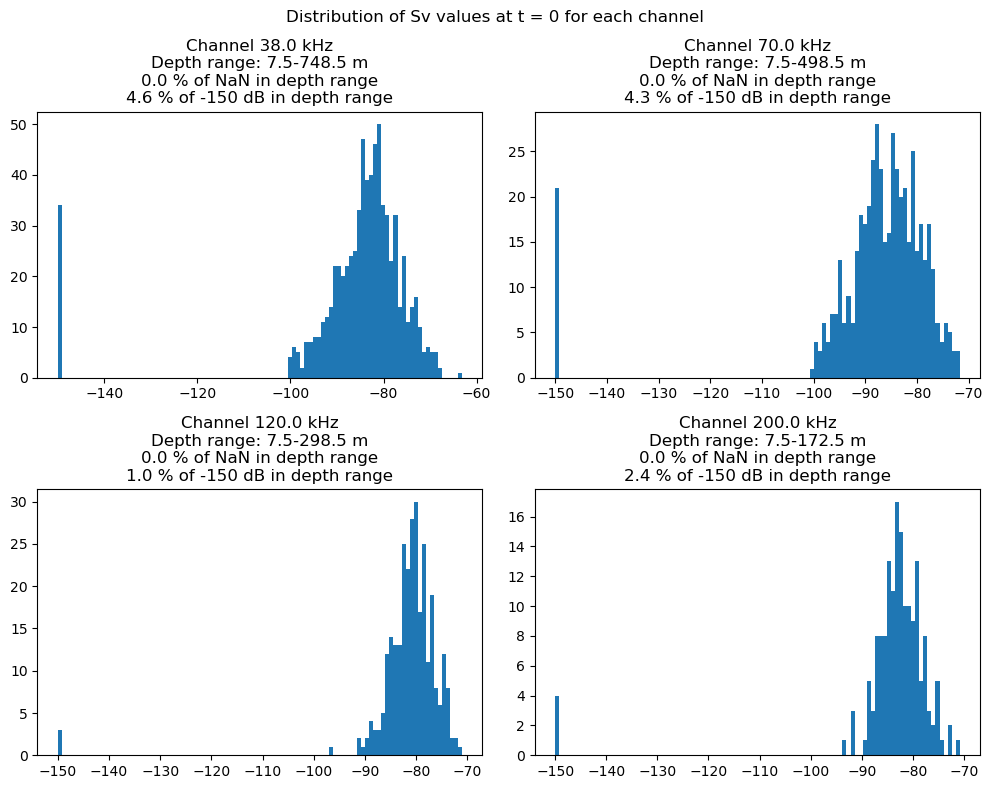

In [7]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

channels = x_t["channel"].unique()

for i in range(2):
    for j in range(2):
        # Select channel
        channel = channels[i*2 + j]

        x_t_sel = x_t[x_t["channel"] == channel]

        # Compute % of Sv NaN in the channel's depth range
        depth_min = channels_depth_ranges.loc[channel, ('depth', 'min')]
        depth_max = channels_depth_ranges.loc[channel, ('depth', 'max')]

        x_t_sel_depth_range = x_t_sel[(x_t_sel["depth"] >= depth_min) & (x_t_sel["depth"] <= depth_max)]
        n_points = len(x_t_sel_depth_range)
        n_nan = x_t_sel_depth_range["Sv"].isna().sum()
        nan_pct = (n_nan / n_points) * 100

        # Compute % of Sv -150 in depth range
        n_minus_150 = (x_t_sel_depth_range["Sv"] == -150).sum()
        minus_150_pct = (n_minus_150 / n_points) * 100

        # Plot histogram
        sv = x_t_sel["Sv"]
        ax[i, j].hist(sv, bins= 100)

        # Add title
        ax[i, j].set_title(f"Channel {channel} kHz\nDepth range: {depth_min}-{depth_max} m\n{nan_pct:.1f} % of NaN in depth range\n{minus_150_pct:.1f} % of -150 dB in depth range")

plt.suptitle("Distribution of Sv values at t = 0 for each channel")
plt.tight_layout()
plt.show()

We can observe that a certain amount of values are artificially set to -150 db. In order to visualize clean $S_v(z)$ profiles, we remove those values.

We also compute a moving average along the $z$ axis for each channel, in a order to simply a very noisy dataset.

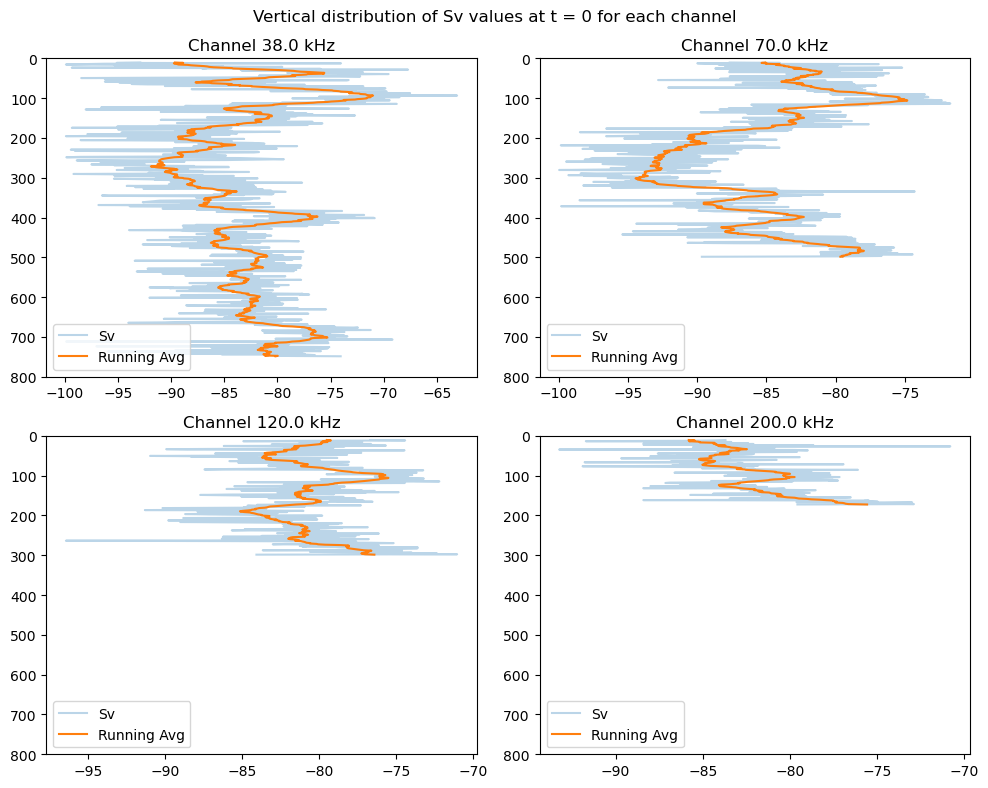

In [8]:
# Show vertical distribution of Sv for each channel at t_0
# Drop -150 values
x_t = x_t.where(x_t["Sv"] != -150)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

# Define window size for running average (adjust as needed)
window_size = 20

for i in range(2):
    for j in range(2):
        # Select channel
        channel = channels[i*2 + j]
        depth_min = channels_depth_ranges.loc[channel, ('depth', 'min')]
        depth_max = channels_depth_ranges.loc[channel, ('depth', 'max')]

        x_t_sel = x_t[x_t["channel"] == channel].copy()
        x_t_sel = x_t_sel[(x_t_sel["depth"] >= depth_min) & (x_t_sel["depth"] <= depth_max)]
        x_t_sel = x_t_sel.sort_values("depth")

        ax[i, j].set_title(f"Channel {channel} kHz")

        # Plot raw data
        ax[i, j].plot(x_t_sel["Sv"], x_t_sel["depth"], label="Sv", alpha=0.3)

        # Compute running average
        x_t_sel["running_avg"] = x_t_sel["Sv"].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plot running average
        ax[i, j].plot(x_t_sel["running_avg"], x_t_sel["depth"], label="Running Avg")

        ax[i, j].set_ylim(800, 0)  # Reverse y axis
        ax[i, j].legend()

plt.suptitle("Vertical distribution of Sv values at t = 0 for each channel")
plt.tight_layout()
plt.show()


## 3. $Sv_{38}$ vertical profile evolution

Let's see how the moving average of the vetical profile evolve through time.

### 3.1 Static plot of the evolution accros 100 ESDU

In [9]:
# Show moving average variation over 100 time steps for channel 38 kHz
# Slice the 100 first times steps for channel 38 kHz
x = ds.Sv.sel(channel = 38).isel(time = slice(0, 100)).to_dataframe().reset_index()
# Drop -150 values
x = x.where(x["Sv"] != -150)
# Compute moving average
window_size = 20
x["running_avg"] = x["Sv"].rolling(window=window_size, min_periods=1).mean()


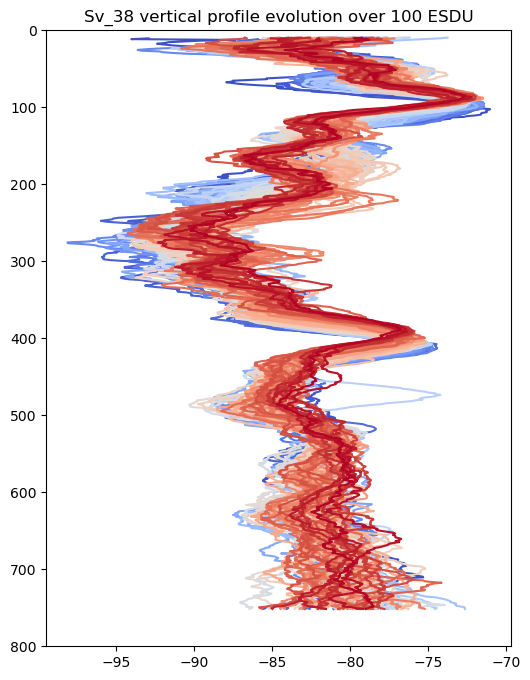

In [10]:
times = x["time"].unique()
cmap = plt.get_cmap("coolwarm", len(times))

plt.figure(figsize=(6, 8))
for i in range(len(times)):
    x_t =  x[x["time"] == times[i]]
    plt.plot(x_t["running_avg"], x_t["depth"],
             alpha=1,
             c=cmap(i))
    plt.ylim(800, 0)

plt.title("Sv_38 vertical profile evolution over 100 ESDU")
plt.show()